# House Price Prediction Assignment

In [1]:
# Supress Warnings

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Importing libraries
import numpy as np
import pandas as pd

# Importing libraries for Visualisation
import matplotlib.pyplot as plt
import seaborn as sns

# Importing libraries for Model building
from sklearn import linear_model
from sklearn.linear_model import LinearRegression

# Importing libraries for Cross validation and regularization model building
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

# Lets check the data

In [3]:
# lets see the data
raw_data = pd.read_csv(r'train.csv')
raw_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


#### Inspecting data

In [4]:
raw_data.shape

(1460, 81)

In [5]:
raw_data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


#### Visualising the data

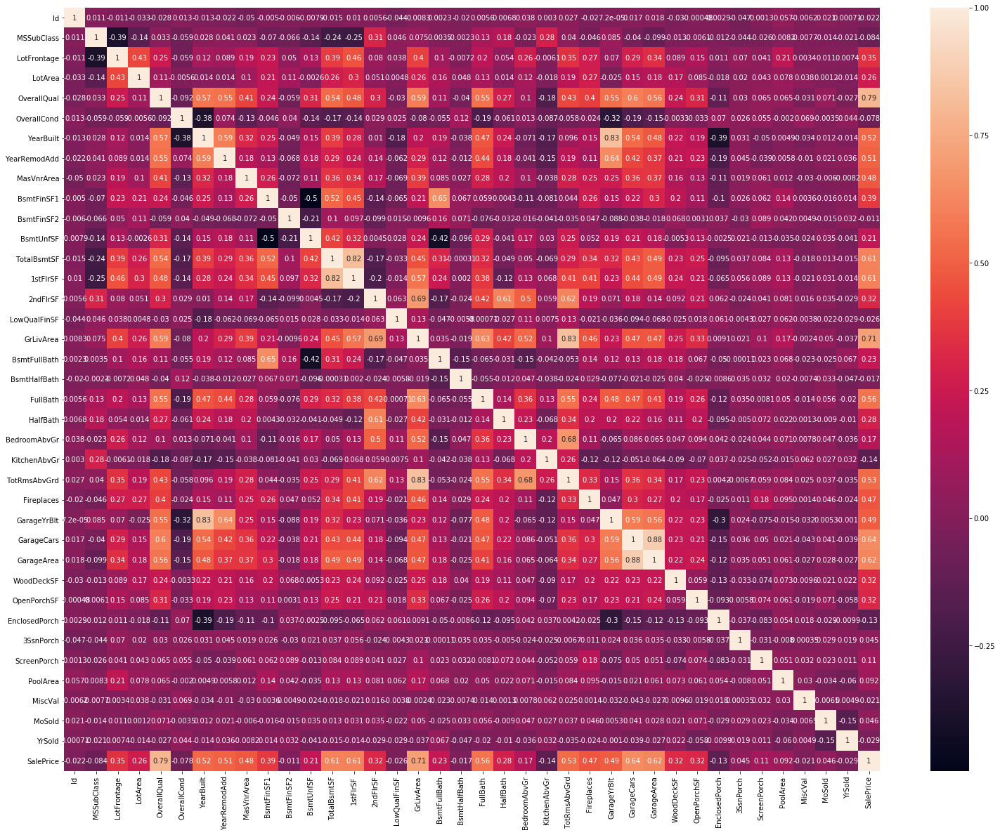

In [6]:
# lets check the correlation by plotting heatmap
plt.figure(figsize=(26,20))
sns.heatmap(raw_data.corr(), annot=True)
plt.show()

# Data Cleaning

In [7]:
# lets check the null values present in data
na = round(100*(raw_data.isnull().sum()/len(raw_data.index)),2)
print(na[na > 0.00].sort_values(ascending=False))

PoolQC          99.52
MiscFeature     96.30
Alley           93.77
Fence           80.75
FireplaceQu     47.26
LotFrontage     17.74
GarageYrBlt      5.55
GarageType       5.55
GarageFinish     5.55
GarageQual       5.55
GarageCond       5.55
BsmtFinType2     2.60
BsmtExposure     2.60
BsmtFinType1     2.53
BsmtCond         2.53
BsmtQual         2.53
MasVnrArea       0.55
MasVnrType       0.55
Electrical       0.07
dtype: float64


+ From the above we can observe that there are null values present
+ But when we check the highest variables having null values in the data file and data description
+ we see that few of variables actual mean that those specific features are not available or present
+ example: PoolQC, NA means that the pool itslef is not available
+ Hence after checking from the data below are the variables which are identified in whihc null values mean it is not   available

•PoolQC - No Pool

•MiscFeature - None

•Alley - No alley access

•Fence - No Fence

•FireplaceQu - No Fireplace

•GarageCond - No Garage

•GarageType - No Garage

•GarageFinish - No Garage

•GarageQual - No Garage

•BsmtExposure - No Basement

•BsmtFinType1 - No Basement

•BsmtFinType2 - No Basement

•BsmtCond - No Basement

•BsmtQual - No Basement



In [8]:
#lets replace the NA values with no as those features are not present
raw_data['Alley'] = raw_data['Alley'].fillna('No')


raw_data['FireplaceQu'] = raw_data['FireplaceQu'].fillna('No')


raw_data['PoolQC'] = raw_data['PoolQC'].fillna('No')


raw_data['Fence'] = raw_data['Fence'].fillna('No')


raw_data['MiscFeature'] = raw_data['MiscFeature'].fillna('None')

col1 = ['GarageType','GarageFinish','GarageQual','GarageCond']
raw_data[col1] = raw_data[col1].fillna('No')

col2 = ['BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2']
raw_data[col2] = raw_data[col2].fillna('No')


In [9]:
# lets check the null values again
na = round(100*(raw_data.isnull().sum()/len(raw_data.index)),2)
print(na[na > 0.00].sort_values(ascending=False))

LotFrontage    17.74
GarageYrBlt     5.55
MasVnrArea      0.55
MasVnrType      0.55
Electrical      0.07
dtype: float64


Looks like the variable 'LotFrontage' has 17.74 percent of null values

and lets remove the oe which are very less

In [10]:
# lets drop the one with less values of null in it
raw_data.dropna(subset = ['GarageYrBlt','Electrical','MasVnrType','MasVnrArea'], inplace=True)

In [11]:
# lets check the null values again
na = round(100*(raw_data.isnull().sum()/len(raw_data.index)),2)
print(na[na > 0.00])

LotFrontage    18.25
dtype: float64


Looks like the variable 'LotFrontage' has more than 18 percent of null values

however the data what we have is not that huge

so lets go ahead and try to replace the null values with mean/median, instead pf removing the whole column

As this appears to be pretty important variable whoch can influence the House price



Lets go ahead and replace the null values with median as there is no nuch difference between mean and median

In [12]:
raw_data['LotFrontage'] = raw_data['LotFrontage'].fillna(raw_data['LotFrontage'].median())

In [13]:
#lets check the null values once more
na = round(100*(raw_data.isnull().sum()/len(raw_data.index)),2)
print(na[na > 0.00])

Series([], dtype: float64)


In [14]:
#now there are no more null values
#lets check the shape of the cleaned data
raw_data.shape

(1370, 81)

### Data Preparation

when looked in the data dictionary, few variables appear to be categorical,below are the variables
- OverallQual
- MSSubClass
- OverallCond

In [15]:
#lets convert the datatype to categorical
raw_data['OverallQual'] = raw_data['OverallQual'].astype('category')
raw_data['MSSubClass'] = raw_data['MSSubClass'].astype('category')
raw_data['OverallCond'] = raw_data['OverallCond'].astype('category')

In [16]:
# lets see the columns with 2 values in them
raw_data.loc[:,(raw_data.nunique()==2)].head()

,Street,Utilities,CentralAir
0,Pave,AllPub,Y
1,Pave,AllPub,Y
2,Pave,AllPub,Y
3,Pave,AllPub,Y
4,Pave,AllPub,Y


In [17]:
# Street column
raw_data['Street'].value_counts()

Pave    1365
Grvl       5
Name: Street, dtype: int64

In [ ]:
# Street column
raw_data['Utilities'].value_counts()

AllPub    1369
NoSeWa       1
Name: Utilities, dtype: int64

In [ ]:
# CentralAir column
raw_data['CentralAir'].value_counts()

Y    1301
N      69
Name: CentralAir, dtype: int64

In [18]:
# lets drop the variables with single value in them
raw_data.drop(['Street','Utilities'], axis=1, inplace=True)

In [19]:
#lets drop the ID column from data
raw_data.drop(['Id'], axis=1, inplace=True)

In [20]:
raw_data.shape

(1370, 78)

# creating dummy variables

In [21]:
# Creating dummy variables for Y and N as 1 and 0 resectively
raw_data['CentralAir'] = raw_data['CentralAir'].map({'Y': 1, 'N': 0})

In [22]:
# Creating dummy variables for variables with more than two values in it
raw_data = pd.get_dummies(raw_data, drop_first=True)


# checking the outliers

In [23]:
# Selecting variables having numerical values in them
raw_data_col = raw_data[['LowQualFinSF','GrLivArea','GarageArea','LotFrontage','LotArea','MasVnrArea','BsmtFinSF1','BsmtUnfSF','TotalBsmtSF','1stFlrSF',
                               '2ndFlrSF','WoodDeckSF','OpenPorchSF','EnclosedPorch','MiscVal']]

In [24]:
#lets see the different percentiles for the cleaned data
raw_data_col.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,LowQualFinSF,GrLivArea,GarageArea,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,WoodDeckSF,OpenPorchSF,EnclosedPorch,MiscVal
count,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000,1370.000000
mean,4.162044,1533.450365,500.462774,70.542336,10687.435036,109.076642,454.211679,570.742336,1073.372263,1176.086131,353.202190,97.656204,47.028467,21.031387,43.170803
std,40.260837,519.489200,185.988074,21.950673,10228.507006,184.589326,458.985739,444.050989,435.558797,385.381717,439.497524,126.805998,64.995049,60.519492,503.247977
min,0.000000,438.000000,160.000000,21.000000,1300.000000,0.000000,0.000000,0.000000,0.000000,438.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1152.000000,377.500000,60.000000,7731.000000,0.000000,0.000000,225.500000,808.500000,894.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,1479.000000,484.000000,70.000000,9591.000000,0.000000,399.500000,477.500000,1008.000000,1098.000000,0.000000,0.000000,27.000000,0.000000,0.000000
75%,0.000000,1788.000000,582.750000,79.000000,11712.750000,171.750000,728.000000,811.000000,1314.000000,1414.000000,737.000000,171.000000,69.000000,0.000000,0.000000
90%,0.000000,2169.300000,770.200000,92.000000,14573.300000,340.000000,1074.400000,1237.300000,1614.200000,1686.100000,975.000000,264.000000,130.000000,108.000000,0.000000
95%,0.000000,2470.750000,856.550000,104.000000,17501.650000,461.750000,1275.650000,1475.500000,1753.000000,1837.100000,1146.950000,341.100000,171.100000,180.000000,0.000000
99%,127.440000,3120.680000,1015.860000,134.930000,39410.900000,802.200000,1583.230000,1796.550000,2175.980000,2218.860000,1417.720000,509.620000,282.930000,260.550000,700.000000


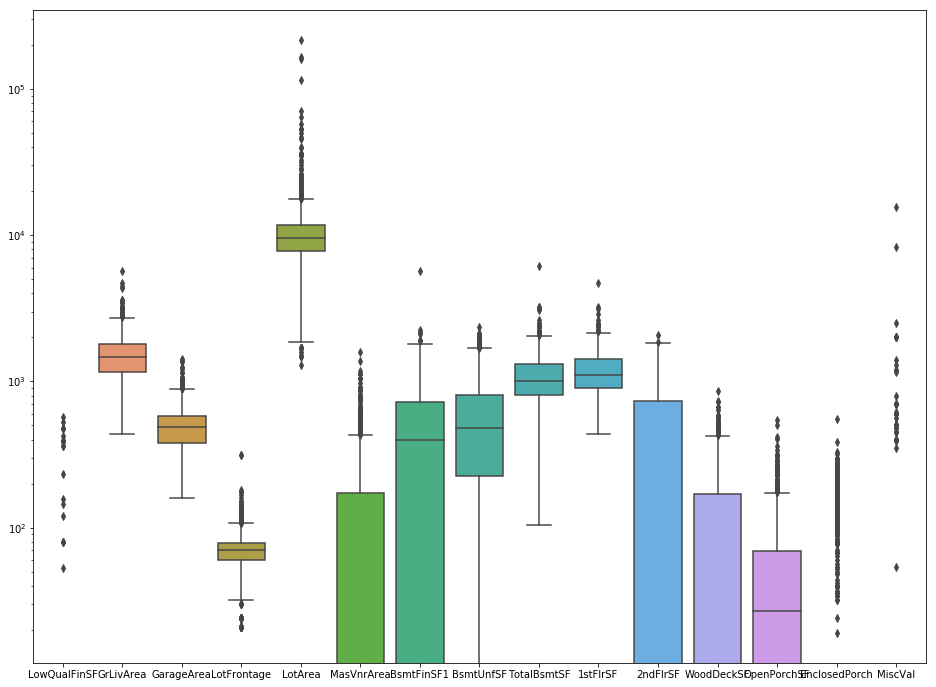

In [25]:
# lets plot the boxplot to check the outliers
plt.figure(figsize = (16,12))
bp = sns.boxplot(data = raw_data_col)
bp.set_yscale('log')
plt.show()

we can clearly see that the outliers are being present lets treat them

In [26]:
#lets get the 99% for treating the outliers for all the numerical variables

LotFrontage = raw_data["LotFrontage"].quantile(.99)

LotArea = raw_data["LotArea"].quantile(.99)

MasVnrArea = raw_data["MasVnrArea"].quantile(.99)

BsmtFinSF1 = raw_data["BsmtFinSF1"].quantile(.99)

BsmtUnfSF = raw_data["BsmtUnfSF"].quantile(.99)

TotalBsmtSF = raw_data["TotalBsmtSF"].quantile(.99)

EnclosedPorch = raw_data["EnclosedPorch"].quantile(.99)

MiscVal = raw_data["MiscVal"].quantile(.99)

FirstFlrSF = raw_data["1stFlrSF"].quantile(.99)

SecondFlrSF = raw_data["2ndFlrSF"].quantile(.99)

LowQualFinSF = raw_data["LowQualFinSF"].quantile(.99)

GrLivArea = raw_data["GrLivArea"].quantile(.99)

GarageArea = raw_data["GarageArea"].quantile(.99)

WoodDeckSF = raw_data["WoodDeckSF"].quantile(.99)

OpenPorchSF = raw_data["OpenPorchSF"].quantile(.99)

In [27]:
raw_data = raw_data.loc[(raw_data["LotFrontage"] <= LotFrontage) & (raw_data["LotArea"] <= LotArea) & 
                              (raw_data["MasVnrArea"] <= MasVnrArea) & (raw_data["BsmtFinSF1"] <= BsmtFinSF1) &
                              (raw_data["BsmtUnfSF"] <= BsmtUnfSF) & (raw_data["TotalBsmtSF"] <= TotalBsmtSF) & 
                              (raw_data["1stFlrSF"] <= FirstFlrSF) & (raw_data["2ndFlrSF"] <= SecondFlrSF) & 
                              (raw_data["LowQualFinSF"] <= LowQualFinSF) & (raw_data["GrLivArea"] <= GrLivArea) &
                              (raw_data["GarageArea"] <= GarageArea) & (raw_data["WoodDeckSF"] <= WoodDeckSF) & 
                              (raw_data["OpenPorchSF"] <= OpenPorchSF) &  (raw_data["EnclosedPorch"] <= EnclosedPorch) &
                              (raw_data["MiscVal"] <= MiscVal)]

In [28]:
raw_data.shape

(1229, 277)

# Lets Split the data into test and train

In [29]:
# Importing train-test split
from sklearn.model_selection import train_test_split

# lets drop the saleprice for creating X
X = raw_data.drop(['SalePrice'], axis=1)
#lets store the Saleprice in Y 
y = raw_data['SalePrice']

In [30]:
# lets split the data into train an dtest
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

# Scaling the data

In [31]:
# lets import the library for scaling
from sklearn.preprocessing import StandardScaler

In [32]:
X_train[['LotFrontage','LotArea','MasVnrArea','1stFlrSF','2ndFlrSF','LowQualFinSF',
         'GrLivArea','GarageArea','BsmtFinSF1','BsmtUnfSF','TotalBsmtSF','WoodDeckSF','OpenPorchSF','EnclosedPorch','MiscVal']]
X_train.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
1113,66.0,8923,1953,2006,0.0,643,0,365,1008,1,...,0,0,0,0,1,0,0,0,1,0
284,50.0,8012,1992,1992,0.0,430,0,1145,1575,1,...,0,0,0,0,1,0,0,0,1,0
722,70.0,8120,1970,1970,0.0,191,0,673,864,1,...,0,0,0,0,1,0,0,0,1,0
260,120.0,19296,1962,1962,399.0,672,690,0,1362,1,...,0,0,0,0,1,0,0,0,1,0
550,53.0,4043,1977,1977,0.0,559,0,510,1069,1,...,0,0,0,0,0,0,0,0,0,0


In [33]:
scaler = StandardScaler()

# lets do standardization on which scaling is needed
X_train[['LotFrontage', 'LotArea','MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
        'BsmtUnfSF','TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 
        'GrLivArea','GarageArea', 'WoodDeckSF', 'OpenPorchSF','EnclosedPorch',
        '3SsnPorch','ScreenPorch', 'PoolArea',
        'MiscVal']] = scaler.fit_transform(X_train[['LotFrontage', 'LotArea','MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
                                                    'BsmtUnfSF','TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 
                                                    'GrLivArea','GarageArea', 'WoodDeckSF', 'OpenPorchSF','EnclosedPorch',
                                                    '3SsnPorch','ScreenPorch', 'PoolArea',
                                                    'MiscVal']])
X_train.head()

C:\Users\metimats\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\metimats\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\base.py:462: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
1113,-0.136985,-0.147522,1953,2006,-0.637147,0.545541,-0.294568,-0.433571,-0.034202,1,...,0,0,0,0,1,0,0,0,1,0
284,-1.010033,-0.366496,1992,1992,-0.637147,0.015340,-0.294568,1.428160,1.512605,1,...,0,0,0,0,1,0,0,0,1,0
722,0.081277,-0.340536,1970,1970,-0.637147,-0.579580,-0.294568,0.301574,-0.427042,1,...,0,0,0,0,1,0,0,0,1,0
260,2.809554,2.345798,1962,1962,2.327778,0.617728,3.766507,-1.304766,0.931530,1,...,0,0,0,0,1,0,0,0,1,0
550,-0.846337,-1.320510,1977,1977,-0.637147,0.336448,-0.294568,-0.087480,0.132209,1,...,0,0,0,0,0,0,0,0,0,0


# lets check the correlation

In [34]:
# lets check the Correlation matrix
corr = X_train.corr() 
cm = sns.light_palette("blue", as_cmap=True) 
corr.style.background_gradient(cmap=cm).set_precision(2)

In [ ]:
# Selecting only columns having correlation more than 0.70
rows, cols = X_train.shape
col = list(X_train.columns)

corr = X_train.corr().values

for i in range(cols):
    for j in range(i+1, cols):
        if corr[i,j] > 0.80:
            print(col[i], ' ', col[j], ' ', corr[i,j])

In [ ]:
X_train.drop(['HouseStyle_2Story','MiscFeature_Shed','MSSubClass_45','MSSubClass_75','MSSubClass_80','MSSubClass_85',
              'MSSubClass_90', 'MSSubClass_190','Neighborhood_Somerst','Exterior2nd_CBlock','Exterior2nd_CmentBd',
              'Exterior2nd_HdBoard','Exterior2nd_MetalSd', 'Exterior2nd_VinylSd','Exterior2nd_Wd Sdng','BsmtQual_No_Basement',
              'BsmtCond_No_Basement', 'Electrical_Mix', 'BsmtExposure_No_Basement','BsmtFinType2_No_Basement',
              'SaleCondition_Partial'], axis=1, inplace=True)

X_test.drop(['HouseStyle_2Story','MiscFeature_Shed','MSSubClass_45','MSSubClass_75','MSSubClass_80','MSSubClass_85',
              'MSSubClass_90', 'MSSubClass_190','Neighborhood_Somerst','Exterior2nd_CBlock','Exterior2nd_CmentBd',
              'Exterior2nd_HdBoard','Exterior2nd_MetalSd', 'Exterior2nd_VinylSd','Exterior2nd_Wd Sdng','BsmtQual_No_Basement',
              'BsmtCond_No_Basement', 'Electrical_Mix', 'BsmtExposure_No_Basement','BsmtFinType2_No_Basement',
              'SaleCondition_Partial'], axis=1, inplace=True)

In [ ]:
# Inspecting dataframe before model building
X_train.shape

#  Model Building and Prediction

In [ ]:
# Import library to find out score (R2)
from sklearn import metrics
from sklearn.metrics import r2_score

In [ ]:
# Performing Standardization of columns which needs to be scaled on test data
X_test[['LotFrontage', 'LotArea','MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
        'BsmtUnfSF','TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 
        'GrLivArea','GarageArea', 'WoodDeckSF', 'OpenPorchSF','EnclosedPorch',
        '3SsnPorch','ScreenPorch', 'PoolArea',
        'MiscVal']] = scaler.transform(X_test[['LotFrontage', 'LotArea','MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
                                                    'BsmtUnfSF','TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 
                                                    'GrLivArea','GarageArea', 'WoodDeckSF', 'OpenPorchSF','EnclosedPorch',
                                                    '3SsnPorch','ScreenPorch', 'PoolArea',
                                                    'MiscVal']])
X_test.head()

##  Lasso Regression

In [88]:
# list of alphas to tune
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 
                    6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

lasso = Lasso()

# cross validation
folds = 5 # selecting number of fold for cross validation

# Performing Grid Search Cross Validation using Lasso
lasso_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, return_train_score=True, verbose = 1)            

# Fitting on train data
lasso_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
C:\Users\metimats\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\metimats\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\metimats\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C

C:\Users\metimats\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\metimats\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\metimats\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\metimats\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\line

C:\Users\metimats\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\metimats\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\metimats\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\metimats\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\line

C:\Users\metimats\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\metimats\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\metimats\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\metimats\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\line

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='neg_mean_absolute_error', verbose=1)

In [89]:
# Results of lasso regression for various alpha
cv_results = pd.DataFrame(lasso_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.471089,0.031232,0.004314,0.005810,0.0001,{'alpha': 0.0001},-15850.771500,-15879.429418,-15780.327652,-16134.953732,...,-15764.845758,316.621099,27,-9419.235134,-9174.810436,-9445.517043,-9236.574773,-9163.680273,-9287.963532,120.785842
1,0.397376,0.037323,0.006202,0.007596,0.001,{'alpha': 0.001},-15845.201499,-15881.830603,-15794.500219,-16123.791673,...,-15764.824010,314.107723,26,-9419.242453,-9174.824170,-9445.526840,-9236.593792,-9163.718034,-9287.981058,120.778027
2,0.376131,0.015002,0.000000,0.000000,0.01,{'alpha': 0.01},-15786.777089,-15806.955817,-15936.225854,-16015.143610,...,-15744.881540,295.004791,25,-9419.426565,-9175.052939,-9445.718470,-9236.906325,-9164.208836,-9288.262627,120.697612
3,0.369869,0.013925,0.000000,0.000000,0.05,{'alpha': 0.05},-15675.908803,-15679.006045,-16029.566762,-15683.216530,...,-15649.890009,270.533953,24,-9420.376644,-9176.243879,-9446.655610,-9238.125615,-9166.400775,-9289.560504,120.371308
4,0.380766,0.027519,0.004602,0.005716,0.1,{'alpha': 0.1},-15566.378935,-15571.231950,-15996.759048,-15660.160191,...,-15611.926695,234.281668,23,-9421.552504,-9177.720353,-9447.734606,-9239.664539,-9169.195460,-9291.173492,119.927892


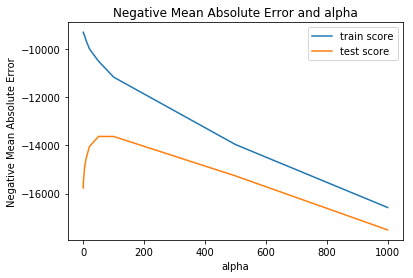

In [90]:
# plotting mean test and train scores with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score']) # Plotting Mean train score
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score']) # Plotting Mean test score

plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')

plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper right')

plt.show()

In [91]:
# Get the best alpha value and it's respective R2 score
print('Best value is: %s' % lasso_cv.best_params_)
print('r2 Score when %s: is %s \n' % (lasso_cv.best_params_, r2_score(y_test,lasso_cv.predict(X_test))))

Best value is: {'alpha': 50}
r2 Score when {'alpha': 50}: is 0.914318455943172 



### Lasso Regression using Optimal alpha value

In [ ]:
# Lasso regression for optimal alpha obtained from Lasso Regression on various alpha's
lasso = Lasso(alpha=50)

# Fitting on train data
lasso.fit(X_train, y_train) 

In [ ]:
# Coefficients after performing Lasso regression
lasso.coef_

In [ ]:
# Features and thier respective coefficients
lasso_coeffs_df = pd.DataFrame(list(zip(X.columns, lasso.coef_)), columns = ['Features', 'Coefficients'])
lasso_coeffs_df.sort_values(by='Coefficients', ascending=False).head(10)

In [ ]:
# Positive coefficients obtained from Lasso Regression
lasso_pos_coeffs_df = lasso_coeffs_df[(lasso_coeffs_df['Coefficients'])>0].sort_values(by='Coefficients', ascending=False)
lasso_pos_coeffs_df.head(10)

In [ ]:
# Negative coefficients obtained from Lasso Regression
lasso_neg_coeffs_df = lasso_coeffs_df[(lasso_coeffs_df['Coefficients'])<0].sort_values(by='Coefficients', ascending=False)
lasso_neg_coeffs_df.head(10)

In [ ]:
# Non-zero coefficients obtained from Lasso Regression
lasso_df_nonzero = lasso_coeffs_df[(lasso_coeffs_df['Coefficients'])!=0].sort_values(by='Coefficients', ascending=False)

### Predictions using Lasso Regression

In [ ]:
# Prediction on train dataset for Lasso
y_train_pred = lasso.predict(X_train)

# Prediction on test dataset for Lasso
y_test_pred = lasso.predict(X_test)

#### RMSE value for train and test data

In [ ]:
from math import sqrt

# RMSE on train data
print('RMSE(Root Mean Squared Error) train data :', np.sqrt(metrics.mean_squared_error(y_train, y_train_pred)))
print("\n")

# RMSE on test data
print('RMSE(Root Mean Squared Error) test data :', np.sqrt(metrics.mean_squared_error(y_test, y_test_pred)))

#### R2_score for train and test data

In [ ]:
# on train data
print("R2 on train data",r2_score(y_train, y_train_pred))
print("\n")

# on test data
print("R2 on test data",r2_score(y_test, y_test_pred))

#### AIC, BIC and Adjusted R_Square for test data
We can skip calculating this, but for comparing models from Lasso and Ridge regression its better to calculate.

In [ ]:
n = len(X_test)

# Calculating residual
resid = y_test - y_test_pred
sse = sum(resid**2)

k = len(lasso_df_nonzero['Features'])

# Calculating AIC
AIC = 2*k + 2*np.log(sse/n)
print("AIC",AIC)
print("\n")

# Calculating BIC
BIC = n*np.log(sse/n) + k*np.log(n)
print("BIC",BIC)
print("\n")

# Calculating r2
TSS = sum((y_test - np.mean(y_test))**2)
r_square = 1-(float(sse))/TSS
print("r_square",r_square)
print("\n")

# Calculating adjusted r2
adjusted_r_square = 1 - (1-r_square)*(n-1)/(n-k-1)
print("adjusted_r_square",adjusted_r_square)

### Model Evaluation (Visualising predictions)

In [ ]:
# Regression Plot
predict = sns.regplot(x=y_test_pred, y=y_test, fit_reg=True)
predict.set(xlabel='Predicted House Prices', ylabel='Actual House Prices')
plt.title('Plot for Actual vs Predicted Values')
plt.show()

### Residual Analysis

#### For train data

In [ ]:
# Residual Plot on train data
sns.residplot(x=y_train_pred, y=y_train, lowess=True)
plt.title('Residual Plot for train data')
plt.show()

#### For test data

In [ ]:
# Residual Plot on test data
sns.residplot(x=y_test_pred, y=y_test, lowess=True)
plt.title('Residual Plot for test data')
plt.show()

#### Plot for train and test data

In [ ]:
# Residual plot on train and test data combined
plt.scatter(y_train_pred, y_train_pred - y_train, c='b', s=40, alpha=0.5)
plt.scatter(y_test_pred, y_test_pred - y_test, c='g', s=40)

plt.title("Lasso regularization for train (blue) and test (green) data")
plt.xlabel("Predicted values")
plt.ylabel('Residuals')
plt.show()

##  Ridge Regression

In [ ]:
# list of alphas to tune
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 
                    6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

ridge = Ridge()

# cross validation
folds = 5 # selecting number of fold for cross validation

# Performing Grid Search Cross Validation using Ridge
ridge_cv = GridSearchCV(estimator = ridge, 
                              param_grid = params, 
                              scoring= 'neg_mean_absolute_error', 
                              cv = folds, return_train_score=True, verbose = 1)

# Fitting on train data
ridge_cv.fit(X_train, y_train) 

In [ ]:
# Results of lasso regression for various alpha
cv_results = pd.DataFrame(ridge_cv.cv_results_)
cv_results = cv_results[cv_results['param_alpha']<=200]
cv_results.head()

In [ ]:
# plotting mean test and train scoes with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper right')
plt.show()

In [ ]:
# Get the best alpha value and it's respective R2 score
print('Best value is: %s' % ridge_cv.best_params_)
print('r2 Score when %s: is %s \n' % (ridge_cv.best_params_, r2_score(y_test,ridge_cv.predict(X_test))))

In [ ]:
# Ridge regression for optimal alpha obtained from Ridge Regression on various alpha's
ridge = Ridge(alpha=6)

# Fitting on train data
ridge.fit(X_train, y_train)

In [ ]:
# Coefficients after performing Ridge regression
ridge.coef_

In [ ]:
# Features and their respective coefficients
ridge_coeffs_df = pd.DataFrame(list(zip(X.columns, ridge.coef_)), columns = ['Features', 'Coefficients'])
ridge_coeffs_df.sort_values(by='Coefficients', ascending=False).head(10)

In [ ]:
# Positive coefficients obtained from Ridge Regression
ridge_pos_coeffs_df = ridge_coeffs_df[(ridge_coeffs_df['Coefficients'])>0].sort_values(by='Coefficients', ascending=False)
ridge_pos_coeffs_df.head(10)

In [ ]:
# Negative coefficients obtained from Ridge Regression
ridge_neg_coeffs_df = ridge_coeffs_df[(ridge_coeffs_df['Coefficients'])<0].sort_values(by='Coefficients', ascending=False)
ridge_neg_coeffs_df.head(10)

In [ ]:
# Negative coefficients obtained from Ridge Regression
ridge_df_nonzero = ridge_coeffs_df[(ridge_coeffs_df['Coefficients'])!=0].sort_values(by='Coefficients', ascending=False)
ridge_df_nonzero.head(10)

In [ ]:
# Prediction on train dataset for Ridge
y_train_pred1 = ridge_cv.predict(X_train)

# Prediction on test dataset for Ridge
y_test_pred1 = ridge_cv.predict(X_test)

In [ ]:
from math import sqrt

# RMSE on train data
print('RMSE(Root Mean Squared Error) train data :', np.sqrt(metrics.mean_squared_error(y_train, y_train_pred1)))
print("\n")

# RMSE on test data
print('RMSE(Root Mean Squared Error) test data :', np.sqrt(metrics.mean_squared_error(y_test, y_test_pred1)))

In [ ]:
# on train data
print("R2 on train data",r2_score(y_train, y_train_pred1))
print("\n")

# on test data
print("R2 on test data",r2_score(y_test, y_test_pred1))

#### AIC, BIC and Adjusted R_Square of test data


In [ ]:
n = len(X_test)

# Calculating residual
resid = y_test - y_test_pred1
sse = sum(resid**2)

k = len(ridge_df_nonzero['Features'])

# Calculating AIC
AIC = 2*k + 2*np.log(sse/n)
print("AIC",AIC)
print("\n")

# Calculating BIC
BIC = n*np.log(sse/n) + k*np.log(n)
print("BIC",BIC)
print("\n")

# Calculating r2
TSS = sum((y_test - np.mean(y_test))**2)
r_square = 1-(float(sse))/TSS
print("r_square",r_square)
print("\n")

# Calculating adjusted r2
adjusted_r_square = 1 - (1-r_square)*(n-1)/(n-k-1)
print("adjusted_r_square",adjusted_r_square)

### Model Evaluation (Visualising predictions)

In [ ]:
# Regression Plot
predict1 = sns.regplot(x=y_test_pred1, y=y_test, fit_reg=True)
predict1.set(xlabel='Predicted House Prices', ylabel='Actual House Prices')
plt.title('Plot for Actual vs Predicted Values')
plt.show()

### Residual Plots

#### For train data

In [ ]:
# Residual Plot on train data
sns.residplot(x=y_train_pred1, y=y_train, lowess=True)
plt.title('Residual Plot for train data')
plt.show()

#### For test data

In [ ]:
# Residual Plot on test data
sns.residplot(x=y_test_pred1, y=y_test, lowess=True)
plt.title('Residual Plot for test data')
plt.show()

#### Combined

In [ ]:
# Residual plot on train and test data combined
plt.scatter(y_train_pred1, y_train_pred1 - y_train, c='b', s=40, alpha=0.5)
plt.scatter(y_test_pred1, y_test_pred1 - y_test, c='g', s=40)

plt.title("Ridge regularization for train (blue) and test (green) data")
plt.xlabel("Predicted values")
plt.ylabel('Residuals')
plt.show()

#  Conclusion

### From Ridge and Lasoo regression we conclude that
- Both Lambda and R2_score of train and test data produced by Ridge Regression and Lasso Regression are same.
- Optimal value of alpha(lambda)
  - For Ridge regression - 6
  - For Lasso regression - 50

Top 10 features are the below mentioned one

- HouseStyle_SFoyer 
- LandSlope_Sev 
- HouseStyle_SLvl 
- GrLivArea 
- HouseStyle_2Story 
- GarageCond_Po 
- Neighborhood_NoRidge 
- OverallQual_9 
- Heating_Grav 
- ExterCond_Fa 

<span style="color:green">__The Sale Price of a house is more when the above features are present.__</span>

<br>
<span style="color:blue">__The top ten important features that are negatively correlated with the Sale Price are:__</span>

- HalfBath
- Foundation_CBlock 
- MoSold 
- BsmtCond_Gd 
- MSZoning_RL 
- Exterior1st_CemntBd 
- YrSold 
- KitchenQual_Gd 
- HeatingQC_Fa 
- KitchenQual_Fa

<span style="color:green">__The Sale Price of a house the has negative impact means it is less when the above features are present.__</span>